# **Problem 3: Create Your Own Pointillism Art**

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# A.

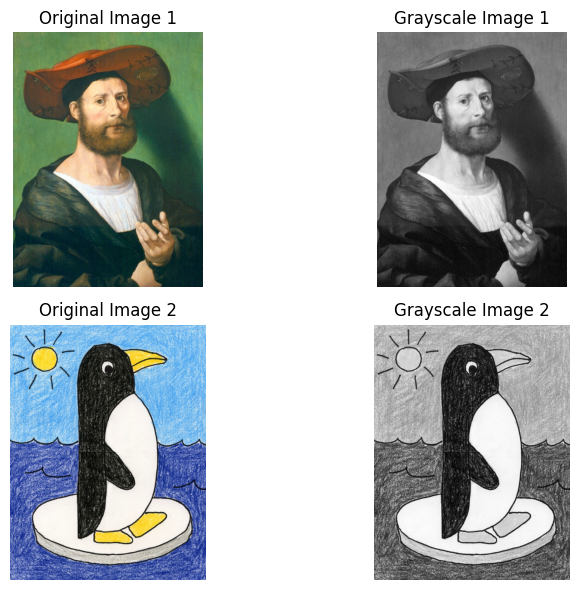

In [2]:
image_1 = cv2.imread('q3_1.jpg')
image_2 = cv2.imread('q3_2.jpg')

# Convert images to RGB and Grayscale
image_1_rgb = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB)
image_2_rgb = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)

image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY)
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)

plt.figure(figsize= (9, 6))
plt.subplot(2, 2, 1)
plt.imshow(image_1_rgb)
plt.title('Original Image 1')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(image_1, cmap = 'gray')
plt.title('Grayscale Image 1')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(image_2_rgb)
plt.title('Original Image 2')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(image_2, cmap = 'gray')
plt.title('Grayscale Image 2')
plt.axis('off')

plt.tight_layout()
plt.show()

# B.

In [3]:
# Detect edges in the image using Sobel, Laplacian and Prewitt filters
def detect_edges(image):

    def sobel_edges(image):
        # Compute Sobel edges in both X and Y directions
        sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
        sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
        return np.sqrt(sobel_x**2 + sobel_y**2) 

    def laplacian_edges(image):
        # Detect sharp edges with Laplacian
        return cv2.Laplacian(image, cv2.CV_64F, ksize=3)

    def prewitt_edges(image):
        # Apply Prewitt filter in X and Y directions and combine the results
        prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
        prewitt_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

        edges_x = cv2.filter2D(image, cv2.CV_64F, prewitt_x)
        edges_y = cv2.filter2D(image, cv2.CV_64F, prewitt_y)
        return np.sqrt(edges_x**2 + edges_y**2)

    # Apply all filters 
    return {
        'sobel': sobel_edges(image),
        'laplacian': laplacian_edges(image),
        'prewitt': prewitt_edges(image)
    }

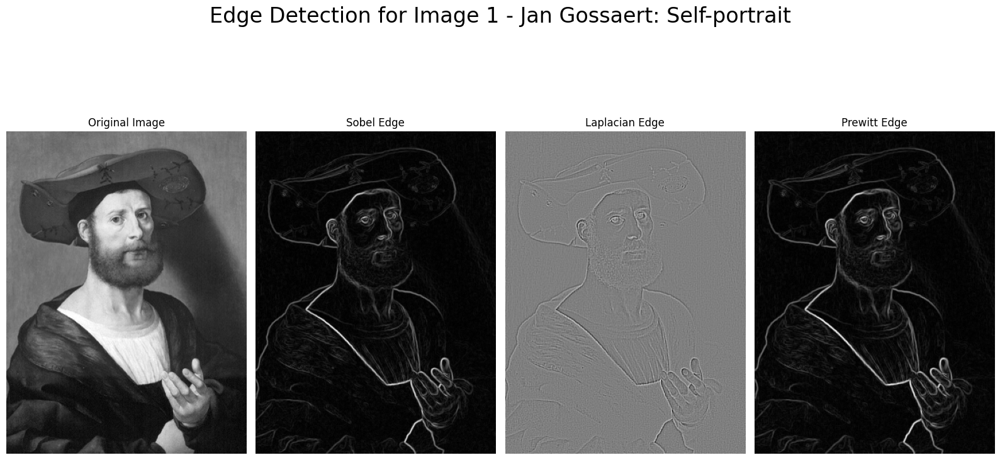

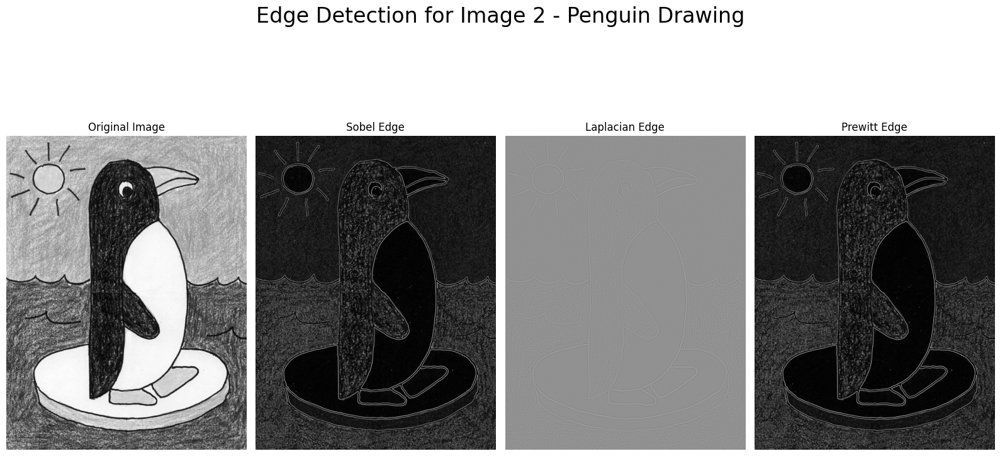

In [4]:
def show_detect_edges(original_image, edges, title):
    plt.figure(figsize=(16, 9))

    # Show original image
    plt.subplot(1, 4, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')
    
    # Show edge detection results for each filter
    for i, (filter_name, edge_image) in enumerate(edges.items(), 2):
        plt.subplot(1, 4, i)
        plt.imshow(edge_image, cmap='gray')
        plt.title(f'{filter_name.capitalize()} Edge')
        plt.axis('off')
    
    plt.suptitle(title, fontsize=24)
    plt.tight_layout()
    plt.show()

edges_image_1 = detect_edges(image_1)
edges_image_2 = detect_edges(image_2)

show_detect_edges(image_1, edges_image_1, 'Edge Detection for Image 1 - Jan Gossaert: Self-portrait')
show_detect_edges(image_2, edges_image_2, 'Edge Detection for Image 2 - Penguin Drawing')

# C.

In [5]:
def create_pointillist_art(original_image, edges, num_points, edge_radius, non_edge_radius):
    # Create a white canvas with the same dimensions as the original image
    height, width = original_image.shape[:2]
    result = np.ones((height, width, 3), dtype=np.uint8) * 255
    
    points = np.random.randint(0, [width, height], size=(num_points, 2))
     
    # Draw circles with radius and color based on edge detection
    for (x, y) in points:
        radius = edge_radius if edges[y, x] > 0 else non_edge_radius
        color = tuple(map(int, original_image[y, x]))
        cv2.circle(result, (x, y), radius, color, -1) 
    
    return result 

# D.

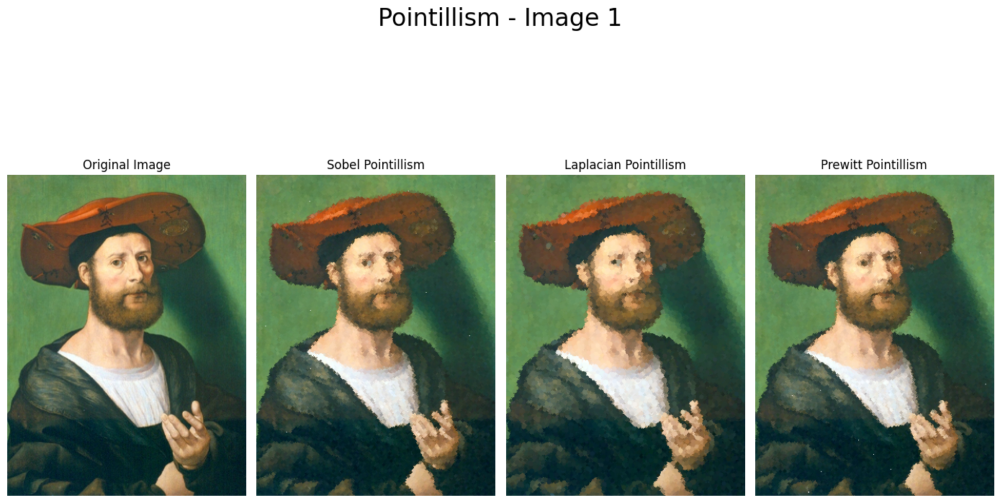

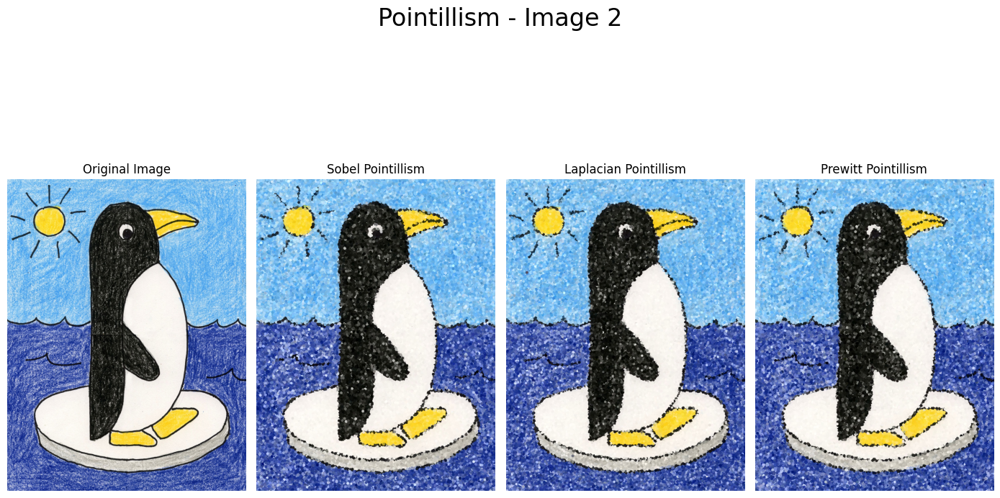

In [24]:
# Apply pointillism on image 1 using Sobel, Laplacian, and Prewitt edges
pointillism_1_sobel = create_pointillist_art(image_1_rgb, edges_image_1['sobel'], num_points=100000, edge_radius=2, non_edge_radius=3)
pointillism_1_laplacian = create_pointillist_art(image_1_rgb, edges_image_1['laplacian'], num_points=100000, edge_radius=2, non_edge_radius=3)
pointillism_1_prewitt = create_pointillist_art(image_1_rgb, edges_image_1['prewitt'], num_points=100000, edge_radius=2, non_edge_radius=3)

# Apply pointillism on image 2 using Sobel, Laplacian, and Prewitt edges
pointillism_2_sobel = create_pointillist_art(image_2_rgb, edges_image_2['sobel'], num_points=100000, edge_radius=7, non_edge_radius=6)
pointillism_2_laplacian = create_pointillist_art(image_2_rgb, edges_image_2['laplacian'], num_points=100000, edge_radius=7, non_edge_radius=6)
pointillism_2_prewitt = create_pointillist_art(image_2_rgb, edges_image_2['prewitt'], num_points=100000, edge_radius=7, non_edge_radius=6)

def show_pointillism(original, sobel, laplacian, prewitt, title):
    plt.figure(figsize=(14, 9))

    # Show original image
    plt.subplot(1, 4, 1)
    plt.imshow(original)
    plt.title('Original Image')
    plt.axis('off')

    filters = [sobel, laplacian, prewitt]
    titles = ['Sobel', 'Laplacian', 'Prewitt']
    
    # Show pointillism results for each filter
    for i in range(3):
        plt.subplot(1, 4, i + 2)
        plt.imshow(filters[i])
        plt.title(f'{titles[i]} Pointillism')
        plt.axis('off')

    plt.suptitle(title, fontsize=24)
    plt.tight_layout()
    plt.show()


show_pointillism(image_1_rgb, pointillism_1_sobel, pointillism_1_laplacian, pointillism_1_prewitt, 'Pointillism - Image 1')
show_pointillism(image_2_rgb, pointillism_2_sobel, pointillism_2_laplacian, pointillism_2_prewitt, 'Pointillism - Image 2')

# E.

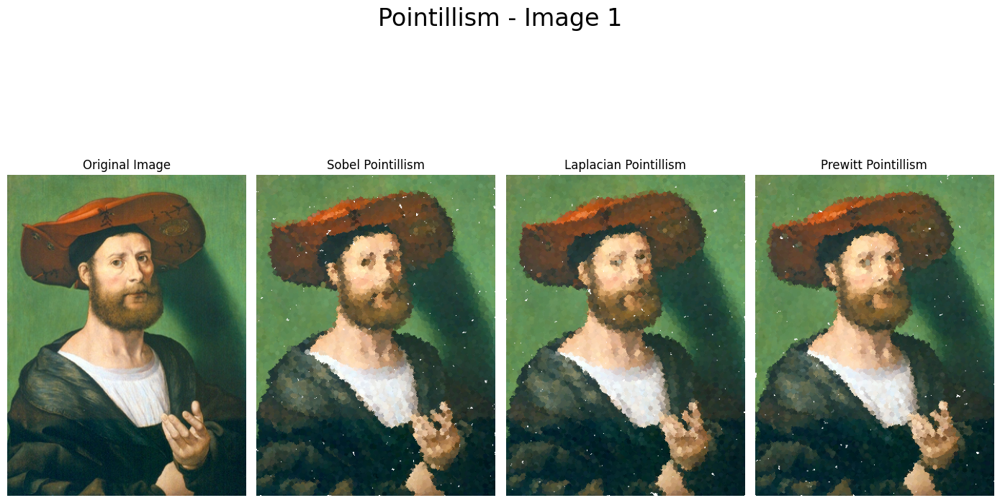

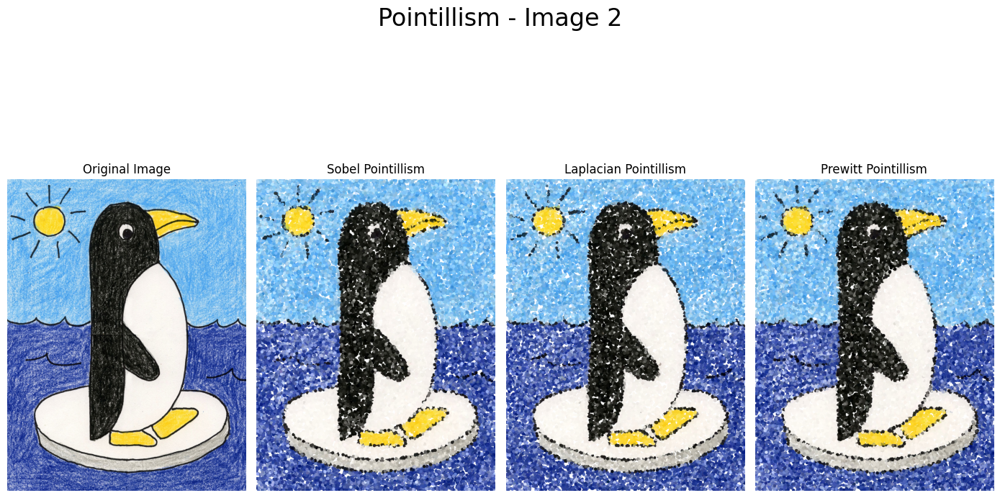

In [22]:
# Apply pointillism on image 1 using Sobel, Laplacian, and Prewitt edges
pointillism_1_sobel = create_pointillist_art(image_1_rgb, edges_image_1['sobel'], num_points=30000, edge_radius=3, non_edge_radius=3)
pointillism_1_laplacian = create_pointillist_art(image_1_rgb, edges_image_1['laplacian'], num_points=30000, edge_radius=3, non_edge_radius=3)
pointillism_1_prewitt = create_pointillist_art(image_1_rgb, edges_image_1['prewitt'], num_points=30000, edge_radius=3, non_edge_radius=3)

# Apply pointillism on image 2 using Sobel, Laplacian, and Prewitt edges
pointillism_2_sobel = create_pointillist_art(image_2_rgb, edges_image_2['sobel'], num_points=30000, edge_radius=8, non_edge_radius=7)
pointillism_2_laplacian = create_pointillist_art(image_2_rgb, edges_image_2['laplacian'], num_points=30000, edge_radius=8, non_edge_radius=7)
pointillism_2_prewitt = create_pointillist_art(image_2_rgb, edges_image_2['prewitt'], num_points=30000, edge_radius=8, non_edge_radius=7)

def show_pointillism(original, sobel, laplacian, prewitt, title):
    plt.figure(figsize=(14, 9))

    # Show original image
    plt.subplot(1, 4, 1)
    plt.imshow(original)
    plt.title('Original Image')
    plt.axis('off')

    filters = [sobel, laplacian, prewitt]
    titles = ['Sobel', 'Laplacian', 'Prewitt']
    
    # Show pointillism results for each filter
    for i in range(3):
        plt.subplot(1, 4, i + 2)
        plt.imshow(filters[i])
        plt.title(f'{titles[i]} Pointillism')
        plt.axis('off')

    plt.suptitle(title, fontsize=24)
    plt.tight_layout()
    plt.show()


show_pointillism(image_1_rgb, pointillism_1_sobel, pointillism_1_laplacian, pointillism_1_prewitt, 'Pointillism - Image 1')
show_pointillism(image_2_rgb, pointillism_2_sobel, pointillism_2_laplacian, pointillism_2_prewitt, 'Pointillism - Image 2')

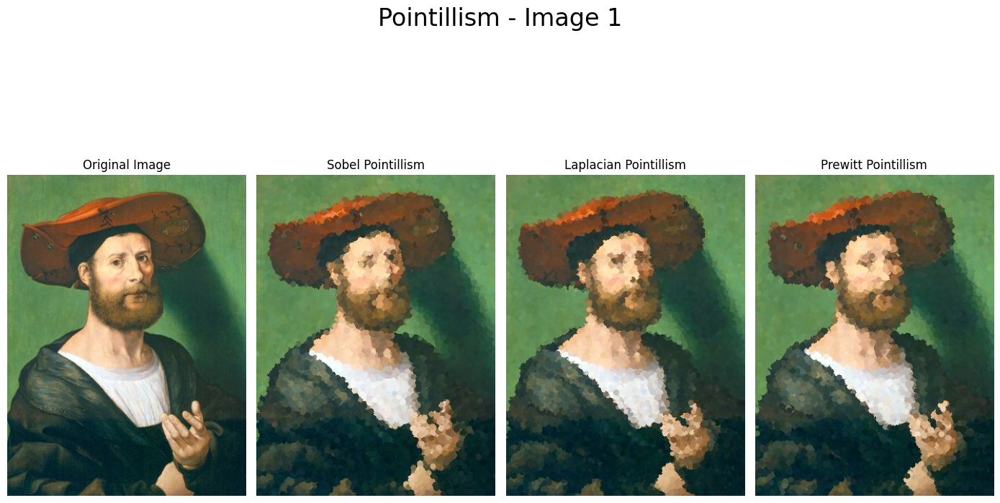

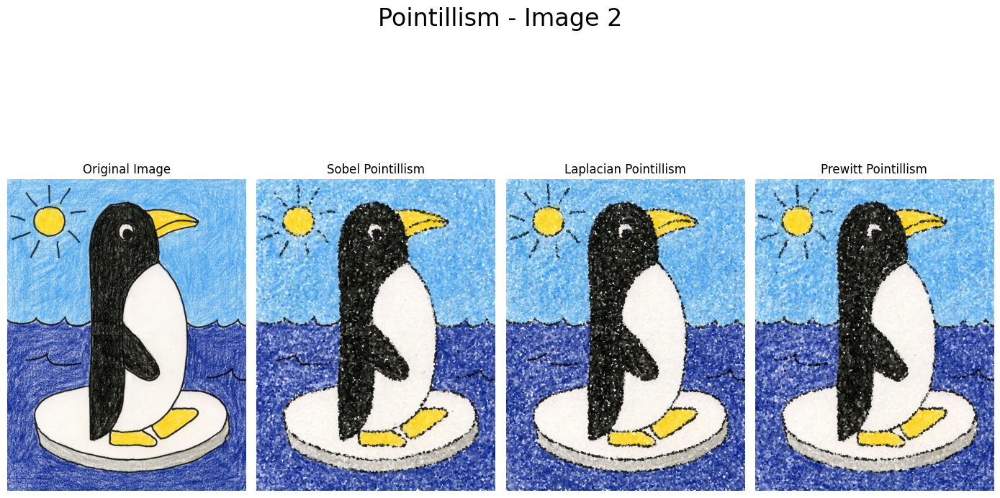

In [23]:
# Apply pointillism on image 1 using Sobel, Laplacian, and Prewitt edges
pointillism_1_sobel = create_pointillist_art(image_1_rgb, edges_image_1['sobel'], num_points=70000, edge_radius=4, non_edge_radius=3)
pointillism_1_laplacian = create_pointillist_art(image_1_rgb, edges_image_1['laplacian'], num_points=70000, edge_radius=4, non_edge_radius=3)
pointillism_1_prewitt = create_pointillist_art(image_1_rgb, edges_image_1['prewitt'], num_points=70000, edge_radius=4, non_edge_radius=3)

# Apply pointillism on image 2 using Sobel, Laplacian, and Prewitt edges
pointillism_2_sobel = create_pointillist_art(image_2_rgb, edges_image_2['sobel'], num_points=70000, edge_radius=6, non_edge_radius=5)
pointillism_2_laplacian = create_pointillist_art(image_2_rgb, edges_image_2['laplacian'], num_points=70000, edge_radius=6, non_edge_radius=5)
pointillism_2_prewitt = create_pointillist_art(image_2_rgb, edges_image_2['prewitt'], num_points=70000, edge_radius=6, non_edge_radius=5)

def show_pointillism(original, sobel, laplacian, prewitt, title):
    plt.figure(figsize=(14, 9))

    # Show original image
    plt.subplot(1, 4, 1)
    plt.imshow(original)
    plt.title('Original Image')
    plt.axis('off')

    filters = [sobel, laplacian, prewitt]
    titles = ['Sobel', 'Laplacian', 'Prewitt']
    
    # Show pointillism results for each filter
    for i in range(3):
        plt.subplot(1, 4, i + 2)
        plt.imshow(filters[i])
        plt.title(f'{titles[i]} Pointillism')
        plt.axis('off')

    plt.suptitle(title, fontsize=24)
    plt.tight_layout()
    plt.show()


show_pointillism(image_1_rgb, pointillism_1_sobel, pointillism_1_laplacian, pointillism_1_prewitt, 'Pointillism - Image 1')
show_pointillism(image_2_rgb, pointillism_2_sobel, pointillism_2_laplacian, pointillism_2_prewitt, 'Pointillism - Image 2')